In [1]:
import joblib
import numpy as np
import os
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.axes3d import Axes3D
from sklearn import (manifold, datasets, decomposition, ensemble, random_projection)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as lda
import csv
from keras import models, layers,optimizers,losses,metrics
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,Dropout
from sklearn.metrics import precision_score, recall_score, f1_score
from keras.callbacks import History

**Define the function which can randomly extract training and testing data**

parameter:  1.data
            2.label
            3.proportion of positive samples and negativa samples (default=1 advise range(1-20))
            4.proportion of training and testing data (default=0.8 for training proportion，range（0-1）)

**降维、分类、可视化网络函数、网格化函数**

In [2]:
def plot_embedding_2d(X, Y,title=None):
    # 坐标缩放到[0,1]区间
    x_min, x_max = np.min(X, axis=0), np.max(X, axis=0)
    X = (X - x_min) / (x_max - x_min)
    x1, y1 = X[:, 0], X[:, 1]
    # x_pos = x1[0:length]
    # y_pos = y1[0:length]
    # x_neg = x1[length:len(x1)]
    # y_neg = y1[length:len(x1)]
    
    x_pos = x1[Y==1]
    y_pos = y1[Y==1]
    x_neg = x1[Y==0]
    y_neg = y1[Y==0]
    
    # 降维后的坐标为（X[i, 0], X[i, 1]），在该位置画出对应的digits
    plt.rcParams["xtick.direction"] = "in"
    plt.rcParams["ytick.direction"] = "in"
    fig = plt.figure(figsize=(16, 16), dpi=300)
    ax = fig.add_subplot(1, 1, 1)

    ax.scatter(x_neg, y_neg, color=plt.cm.Set1(0), alpha=0.2, label='Non-pulsar',s=50)
    ax.scatter(x_pos, y_pos, color=plt.cm.Set1(1), alpha=0.2, label='Pulsar',s=50)
    plt.legend()

    if title is not None:
        plt.title(title)
        dest_dir = "./plots/"
        if not os.path.exists(dest_dir):
            os.makedirs(dest_dir)
        plt.savefig(dest_dir + title + '.png', bbox_inches='tight')
        print
    plt.show()

def standard(data):
    x_min, x_max = np.min(data, axis=0), np.max(data, axis=0)
    X = (data - x_min) / (x_max - x_min)
    return X

def makegrid(data,labels,grid_size = 5):
    standdata = standard(data)
    # 定义网格大小和步长
    step = 1/grid_size
    
    # 计算网格索引
    grid_indices = ((standdata / step).astype(int)).clip(0, grid_size - 1)
        
        
    # 定义CSV文件名
    csv_filename = 'diagnostic_grids.csv'
    
    # 打开CSV文件进行写入
    with open(csv_filename, mode='w', newline='') as file:
        writer = csv.writer(file)
        
        # 写入表头
        writer.writerow(['Grid Index_x','Grid Index_y','label'])
        
        # 将数据名字、对应的网格索引和网格中的数据写入CSV文件
        for i in range(len(standdata)):
            a = str(grid_indices[i][0])
            b = str(grid_indices[i][1])
            writer.writerow([a, b, labels[i]])
    return grid_indices

**Define randomly extract training and testing data based on grouped data(refine vesion of extracting dataset)**

In [3]:
def get_random_data(features,labels,n=1,per = 0.8):

    pulsar_data = features[labels==1]
    RFI_data = features[labels==0]
    pulsar_label = labels[labels==1]
    RFI_label = labels[labels==0]
    
    pulsar_Num=sum(labels)
    # 计算测试集大小
    test_Psize = int(round((1-per) * pulsar_Num))
    test_RFIsize = test_Psize*20
    train_Psize = pulsar_Num-test_Psize
    train_RFIsize = train_Psize*n
    
    
    test_Pindices = []
    test_RFIindices = []
    train_Pindices = []
    train_RFIindices = []
    # 选择测试集索引
    test_Pindices.extend(np.random.choice(pulsar_Num,size=test_Psize, replace=False))
    test_RFIindices.extend(np.random.choice((len(labels)-pulsar_Num),size=test_RFIsize, replace=False))
    
    # 选择训练集索引
    train_Pindices=[idx for idx in range(len(pulsar_data)) if idx not in test_Pindices]
    train_RFI_indices_temp = [idx for idx in range(len(RFI_data)) if idx not in test_RFIindices]
    if len(train_RFI_indices_temp)<=train_RFIsize:
        train_RFIindices.extend(train_RFI_indices_temp)
    else:
        train_RFIindices.extend(np.random.choice(train_RFI_indices_temp, size=train_RFIsize, replace=False))
    
    # 根据索引提取训练集和测试集
    X_Ptrain = pulsar_data[train_Pindices]
    X_RFItrain = RFI_data[train_RFIindices]
    Y_Ptrain = pulsar_label[train_Pindices]
    Y_RFItrain = RFI_label[train_RFIindices]
    X_Ptest = pulsar_data[test_Pindices]
    X_RFItest = RFI_data[test_RFIindices]
    Y_Ptest = pulsar_label[test_Pindices]
    Y_RFItest = RFI_label[test_RFIindices]
    
    X_train = np.concatenate((X_Ptrain,X_RFItrain),axis=0)
    Y_train = np.concatenate((Y_Ptrain,Y_RFItrain))
    X_test = np.concatenate((X_Ptest,X_RFItest),axis=0)
    Y_test = np.concatenate((Y_Ptest,Y_RFItest))
    print('随机提取模式')
    print('训练集中脉冲星：',sum(Y_Ptrain))
    print('训练集中RFI：',len(Y_RFItrain)-sum(Y_RFItrain))
    # print('训练集共有：',len(Y_train))
    
    print('测试集中脉冲星：',sum(Y_Ptest))
    print('测试集中RFI：',len(Y_RFItest)-sum(Y_RFItest),'\n')
    # print('测试集共有：',len(Y_test),'\n')
    return X_train,Y_train,X_test,Y_test

In [4]:
def get_data(grid_class,features,labels,n = 1,per = 0.8):
    train_pulsar_indices = []
    train_RFI_indices = []
    test_pulsar_indices = []
    test_RFI_indices = []

    # grid_class_df = pd.read_csv('diagnostic_grids.csv')
    # grid_class2 = grid_class_df.to_numpy()
    
    # grid_class = makegrid(features,grid_size = 5)
    pulsar_grid = grid_class[labels==1]
    RFI_grid = grid_class[labels==0]
    pulsar_features = features[labels==1]
    RFI_features = features[labels==0]
    
    
    pulsarnum = sum(labels)
    RFInum = pulsarnum * n
    RFItestnum = int(pulsarnum*(1-per) * 20)
    RFItotalnum = len(labels)-pulsarnum
    for group1 in range(5):
        for group2 in range(5):
            # 找到属于当前分组的索引
            group_pulsar_indices = np.where((pulsar_grid[:, 0] == group1) & (pulsar_grid[:, 1] == group2))[0]
            group_RFI_indices = np.where((RFI_grid[:, 0] == group1) & (RFI_grid[:, 1] == group2))[0]
            num_Psamples = len(group_pulsar_indices)
            num_RFIsamples = len(group_RFI_indices)
            # print(num_RFIsamples)
            # 计算测试集大小
            test_Psize = int(round((1-per) * num_Psamples))
#             test_RFIsize = int(round((1-per) * num_RFIsamples*RFInum/RFItotalnum))
            test_RFIsize = int(round(num_RFIsamples*RFItestnum/RFItotalnum))
            train_RFIsize = int(round(per * num_RFIsamples*RFInum/RFItotalnum))
            
            # 选择测试集索引
            test_pulsar_indices.extend(np.random.choice(group_pulsar_indices, size=test_Psize, replace=False))
            test_RFI_indices.extend(np.random.choice(group_RFI_indices, size=test_RFIsize, replace=False))
            # print(len(test_RFI_indices))
            # 选择训练集索引
            train_pulsar_indices.extend([idx for idx in group_pulsar_indices if idx not in test_pulsar_indices])
            train_RFI_indices_temp = [idx for idx in group_RFI_indices if idx not in test_pulsar_indices]
            if len(train_RFI_indices_temp)<=train_RFIsize:
                train_RFI_indices.extend(train_RFI_indices_temp)
            else:
                train_RFI_indices.extend(np.random.choice(train_RFI_indices_temp, size=train_RFIsize, replace=False))
            # print(len(train_RFI_indices),'\n')
    # 根据索引提取训练集和测试集
    X_Ptrain = pulsar_features[train_pulsar_indices]
    X_RFItrain = RFI_features[train_RFI_indices]
    Y_Ptrain = [1]*len(X_Ptrain)
    Y_RFItrain = [0]*len(X_RFItrain)
    X_Ptest = pulsar_features[test_pulsar_indices]
    X_RFItest = RFI_features[test_RFI_indices]
    Y_Ptest = [1]*len(X_Ptest)
    Y_RFItest = [0]*len(X_RFItest)
    
    X_train = np.concatenate((X_Ptrain,X_RFItrain),axis=0)
    Y_train = np.concatenate((Y_Ptrain,Y_RFItrain))
    X_test = np.concatenate((X_Ptest,X_RFItest),axis=0)
    Y_test = np.concatenate((Y_Ptest,Y_RFItest))
    print('网格提取')
    print('训练集中脉冲星：',len(Y_Ptrain),'val',sum(Y_Ptrain))
    print('训练集中RFI：',len(Y_RFItrain),'val',sum(Y_RFItrain))
    print('训练集共有：',len(Y_train))
    
    print('测试集中脉冲星：',len(Y_Ptest),'val',sum(Y_Ptest))
    print('测试集中RFI：',len(Y_RFItest),'val',sum(Y_RFItest))
    print('测试集共有：',len(Y_test),'\n')
    return X_train, Y_train, X_test, Y_test


提取1:1小型数据

1.随机提取

2.降维可视化后提取

共有数据 2392
脉冲星数量 1196
非脉冲星数量 1196 

Computing PCA projection


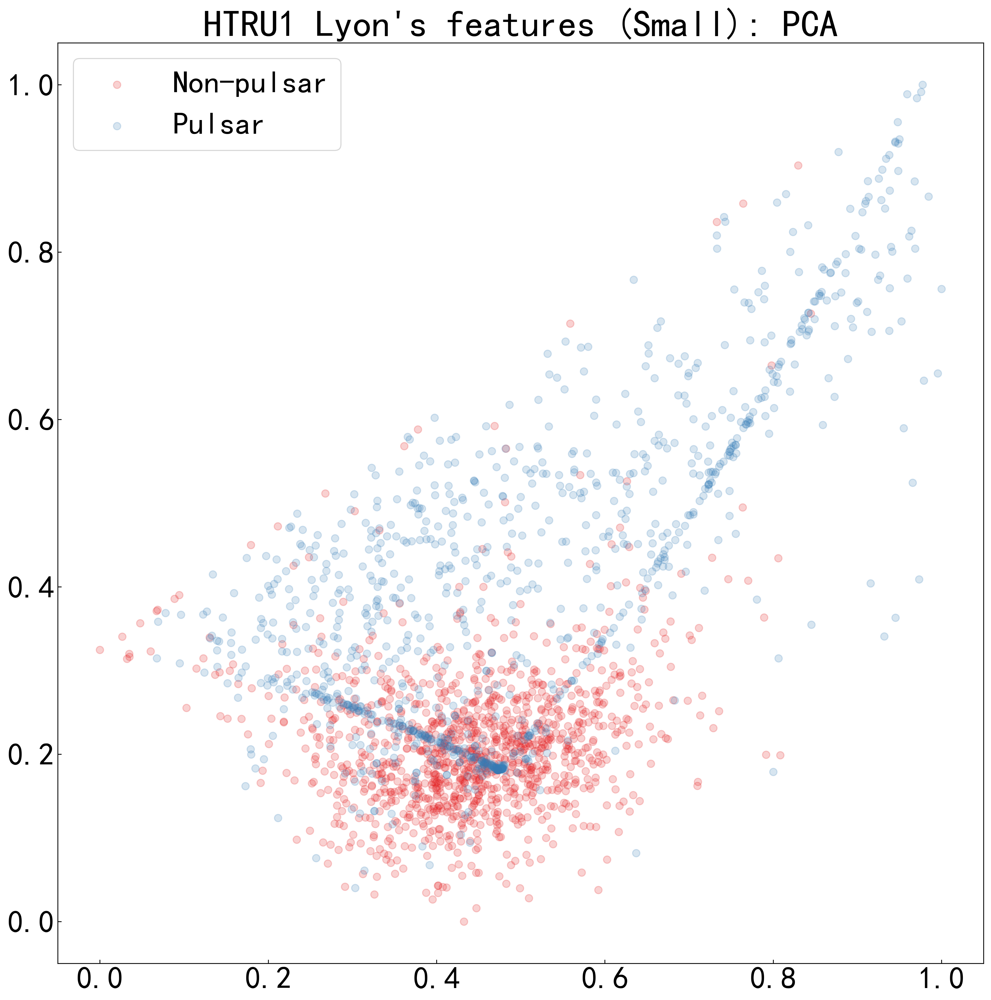

In [5]:
import pandas as pd
from sklearn.impute import SimpleImputer
# 加载数据
# 读取CSV文件
Sdf = pd.read_csv('HTRU1pulsar+1cand.csv', header=0)
# 提取数据（前8列）
Sfeatures = np.array(Sdf.iloc[:, :8])

# 创建SimpleImputer对象，用0填充NaN值
imputer = SimpleImputer(strategy='constant', fill_value=0)

# 对特征数据进行NaN值填充
Sfeatures = imputer.fit_transform(Sfeatures)

# 提取标签（最后一列）
Slabels = np.array(Sdf.iloc[:, -1])

print('共有数据',len(Slabels))
print('脉冲星数量',sum(Slabels))
print('非脉冲星数量',len(Slabels)-sum(Slabels),'\n')

# PCA
print("Computing PCA projection")

# 继续进行PCA投影
Spos_pca = decomposition.TruncatedSVD(n_components=2).fit_transform(Sfeatures)
# Spos_pca = decomposition.TruncatedSVD(n_components=2).fit_transform(Sfeatures)
plot_embedding_2d(Spos_pca, Slabels, title='HTRU1 Lyon\'s features (Small): PCA')

Sgrid_class = makegrid(Spos_pca,Slabels)


提取2：1:N大型数据

1.随机提取

2.降维可视化后提取

共有数据 2392
脉冲星数量 1196
非脉冲星数量 1196 

Computing PCA projection


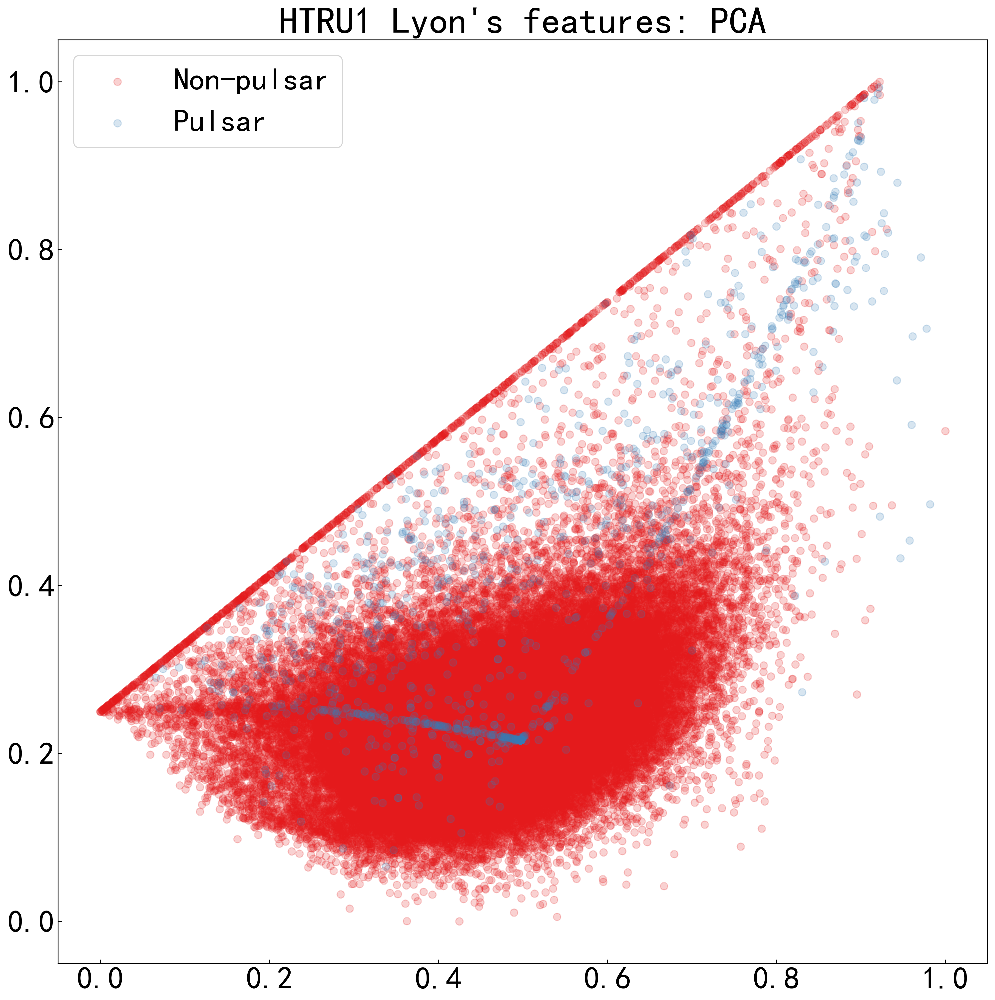

In [6]:
# 读取CSV文件
df = pd.read_csv('HTRU1pulsar+9cand.csv', header=0)
# 提取数据（前8列）
features = np.array(df.iloc[:, :8])

# 创建SimpleImputer对象，用0填充NaN值
imputer = SimpleImputer(strategy='constant', fill_value=0)

# 对特征数据进行NaN值填充
features = imputer.fit_transform(features)

# 提取标签（最后一列）
labels = np.array(df.iloc[:, -1])

print('共有数据',len(Slabels))
print('脉冲星数量',sum(Slabels))
print('非脉冲星数量',len(Slabels)-sum(Slabels),'\n')

# PCA
print("Computing PCA projection")

# 继续进行PCA投影
pos_pca = decomposition.TruncatedSVD(n_components=2).fit_transform(features)
plot_embedding_2d(pos_pca, labels, title='HTRU1 Lyon\'s features: PCA')

grid_class = makegrid(pos_pca,labels)

In [7]:
def remove_outliers(DEdata, data,labels):
    # 计算每个维度的均值和标准差
    means = np.mean(DEdata, axis=0)
    stds = np.std(DEdata, axis=0)
    
    # 标记异常值的索引
    outliers_indices = []
    
    # 遍历每个维度
    for i in range(DEdata.shape[1]):
        # 找到该维度的异常值索引
        outlier_indices_dim = np.where(((DEdata[:, i] < means[i] - 3 * stds[i]) |
                                        (DEdata[:, i] > means[i] + 3 * stds[i])) &
                                       (labels == 0))[0]
        # 添加到总的异常值索引列表中
        outliers_indices.extend(outlier_indices_dim)
    
    # 去除重复的异常值索引
    outliers_indices = list(set(outliers_indices))
    
    # 从原始数据中剔除异常值
    DEdata_cleaned = np.delete(DEdata, outliers_indices, axis=0)
    data_cleaned = np.delete(data, outliers_indices, axis=0)
    labels_cleaned = np.delete(labels, outliers_indices, axis=0)
    
    return DEdata_cleaned,data_cleaned,labels_cleaned


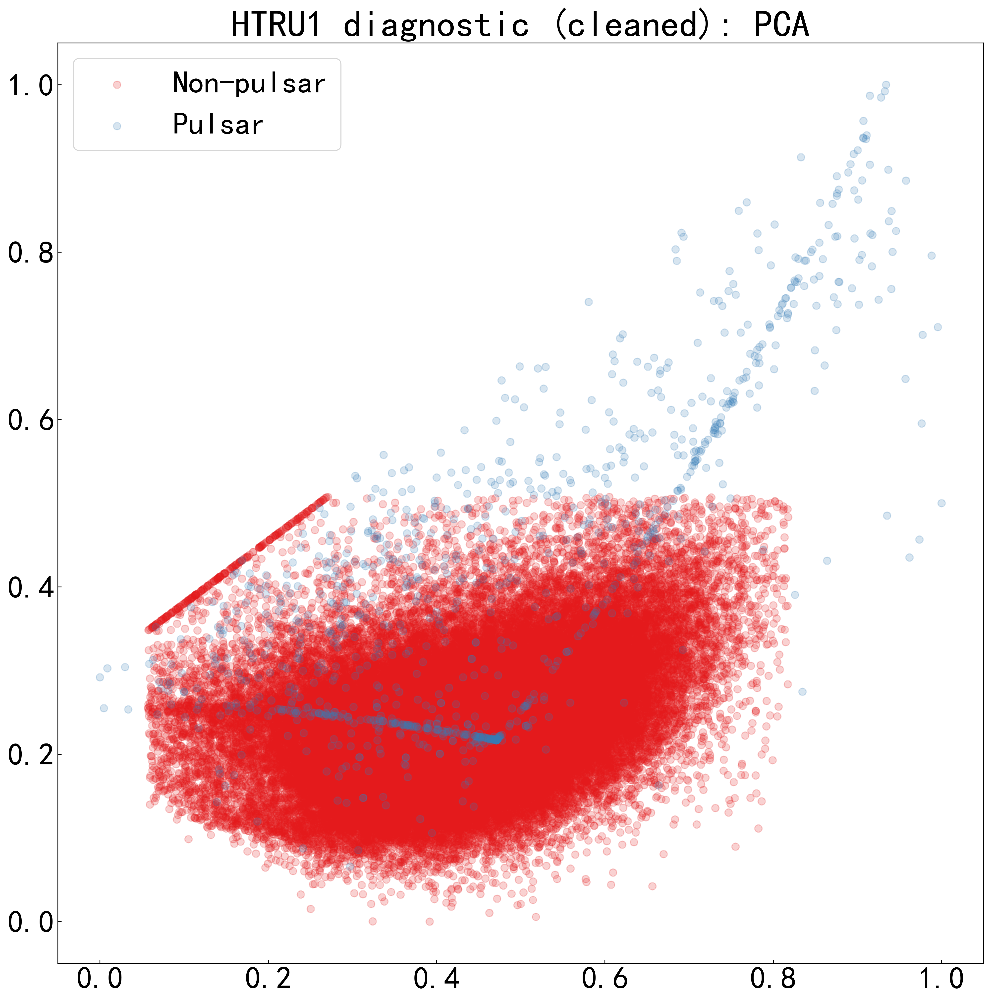

In [8]:
DEdata_cleaned,data_cleaned,labels_cleaned = remove_outliers(pos_pca,features,labels)
plot_embedding_2d(DEdata_cleaned, labels_cleaned, title='HTRU1 diagnostic (cleaned): PCA')
grid_class_Cl = makegrid(DEdata_cleaned, labels_cleaned)


分别使用四组数据两两对比进行测试、分析

算法：随机森林

In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_class_weight

def RF_(grid_class,features,labels,grid_class_Cl,data_cleaned,labels_cleaned,times=10):
    AAtrain_f1 = []
    AAval_f1 = []
    AAtrain_precision = []
    AAval_precision = []
    AAtrain_recall = []
    AAval_recall = []

    AADtrain_f1 = []
    AADval_f1 = []
    AADtrain_precision = []
    AADval_precision = []
    AADtrain_recall = []
    AADval_recall = []

    for i in range(10):
        print('imblance: n=',i+1)
        Atrain_f1 = []
        Aval_f1 = []
        Atrain_precision = []
        Aval_precision = []
        Atrain_recall = []
        Aval_recall = []

        ADtrain_f1 = []
        ADval_f1 = []
        ADtrain_precision = []
        ADval_precision = []
        ADtrain_recall = []
        ADval_recall = []

        for j in range(times):
            print('This is ',j,'th train' )
                
            X_train,Y_train,X_test,Y_test=get_random_data(features,labels,n=i+1)
#             X_train,Y_train,X_test,Y_test=get_data(grid_class,features,labels,n=i+1)
            DX_train, DY_train, DX_test, DY_test = get_data(grid_class_Cl,data_cleaned,labels_cleaned,n=i+1)

            # 计算类别权重
            class_weights = compute_class_weight('balanced', classes=np.unique(Y_train), y=Y_train)

            # 创建随机森林模型，并设置类别权重
            rf_model1 = RandomForestClassifier(n_estimators=100,max_depth=5, class_weight=dict(enumerate(class_weights)))
#             rf_model1 = RandomForestClassifier(n_estimators=100,max_depth=5)
#             rf_model2 = RandomForestClassifier(n_estimators=100,max_depth=5)
            rf_model2 = RandomForestClassifier(n_estimators=100,max_depth=5, class_weight=dict(enumerate(class_weights)))
            # 分别训练模型并评估
            rf_model1.fit(X_train, Y_train)
            train_pred = rf_model1.predict(X_train)
            val_pred = rf_model1.predict(X_test)

            rf_model2.fit(DX_train, DY_train)
            Dtrain_pred = rf_model2.predict(DX_train)
            Dval_pred = rf_model2.predict(DX_test)

            # 计算指标
            train_f1 = f1_score(Y_train, train_pred)
            val_f1 = f1_score(Y_test, val_pred)
            train_precision = precision_score(Y_train, train_pred)
            val_precision = precision_score(Y_test, val_pred)
            train_recall = recall_score(Y_train, train_pred)
            val_recall = recall_score(Y_test, val_pred)

            Dtrain_f1 = f1_score(DY_train, Dtrain_pred)
            Dval_f1 = f1_score(DY_test, Dval_pred)
            Dtrain_precision = precision_score(DY_train, Dtrain_pred)
            Dval_precision = precision_score(DY_test, Dval_pred)
            Dtrain_recall = recall_score(DY_train, Dtrain_pred)
            Dval_recall = recall_score(DY_test, Dval_pred)

            #记录结果
            Atrain_f1.append(train_f1)
            Aval_f1.append(val_f1)
            Atrain_precision.append(train_precision)
            Aval_precision.append(val_precision)
            Atrain_recall.append(train_recall)
            Aval_recall.append(val_recall)

            ADtrain_f1.append(Dtrain_f1)
            ADval_f1.append(Dval_f1)
            ADtrain_precision.append(Dtrain_precision)
            ADval_precision.append(Dval_precision)
            ADtrain_recall.append(Dtrain_recall)
            ADval_recall.append(Dval_recall)

        AAtrain_f1.append(Atrain_f1)
        AAval_f1.append(Aval_f1)
        AAtrain_precision.append(Atrain_precision)
        AAval_precision.append(Aval_precision)
        AAtrain_recall.append(Atrain_recall)
        AAval_recall.append(Aval_recall)

        AADtrain_f1.append(ADtrain_f1)
        AADval_f1.append(ADval_f1)
        AADtrain_precision.append(ADtrain_precision)
        AADval_precision.append(ADval_precision)
        AADtrain_recall.append(ADtrain_recall)
        AADval_recall.append(ADval_recall)        
    return (AAtrain_f1,AAval_f1,AAtrain_precision,AAval_precision,AAtrain_recall,AAval_recall,
            AADtrain_f1,AADval_f1,AADtrain_precision,AADval_precision,AADtrain_recall,AADval_recall)

In [10]:
(RFtrain_f1,RFval_f1,RFtrain_precision,RFval_precision,RFtrain_recall,RFval_recall,
RFDtrain_f1,RFDval_f1,RFDtrain_precision,RFDval_precision,RFDtrain_recall,RFDval_recall)=RF_(grid_class,features,labels,grid_class_Cl,data_cleaned,labels_cleaned, times=10)

imblance: n= 1
This is  0 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 957
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  1 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 957
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  2 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 957
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  3 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 957
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  4 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 957
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  5 th t

This is  2 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 4785
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 4782 val 0
训练集共有： 5743
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  3 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 4785
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 4782 val 0
训练集共有： 5743
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  4 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 4785
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 4782 val 0
训练集共有： 5743
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  5 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 4785
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 4782 val 0
训练集共有： 5743
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  6 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 4785
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 4782 val 0
训练集共有： 5743
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  7 th train


This is  4 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 8613
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 8611 val 0
训练集共有： 9572
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  5 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 8613
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 8611 val 0
训练集共有： 9572
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  6 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 8613
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 8611 val 0
训练集共有： 9572
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  7 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 8613
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 8611 val 0
训练集共有： 9572
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  8 th train
随机提取模式
训练集中脉冲星： 957
训练集中RFI： 8613
测试集中脉冲星： 239
测试集中RFI： 4780 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 8611 val 0
训练集共有： 9572
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  9 th train


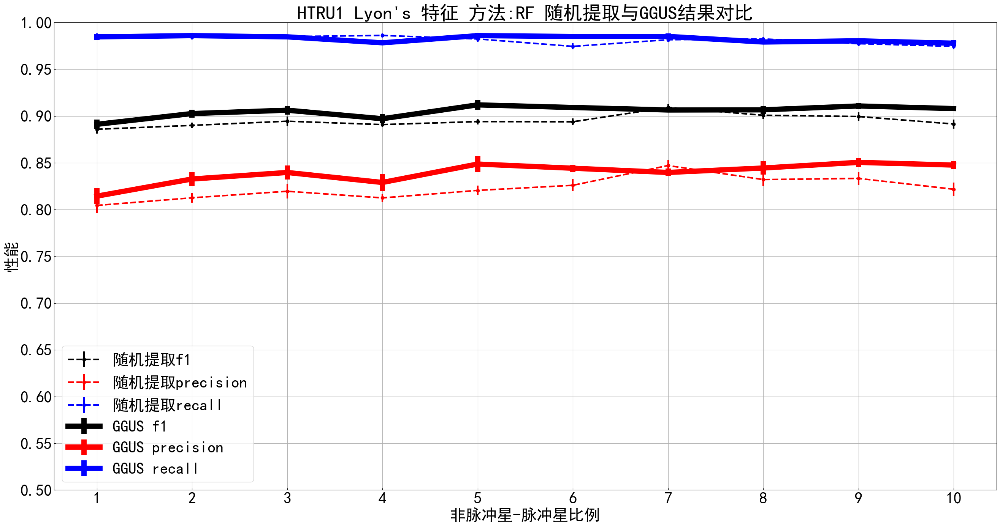

In [11]:
# 计算每组数据的平均值和标准差
def bar_means(data):
    means = np.mean(data,axis=1)
    return means
def bar_errors(data):
    errors= np.std(data, axis=1) / np.sqrt(len(data[0]))
    return errors
plt.figure(figsize=(32, 16))
plt.errorbar(range(1,len(RFtrain_f1)+1), bar_means(RFval_f1), bar_errors(RFval_f1), fmt='o', linestyle='--',label='随机提取f1',color=(0, 0, 0), linewidth=3)
plt.errorbar(range(1,len(RFtrain_f1)+1), bar_means(RFval_precision), bar_errors(RFval_precision), fmt='o', linestyle='--',label='随机提取precision',color='r', linewidth=3)
plt.errorbar(range(1,len(RFtrain_f1)+1), bar_means(RFval_recall), bar_errors(RFval_recall), fmt='o', linestyle='--',label='随机提取recall',color='b', linewidth=3)

plt.errorbar(range(1,len(RFDtrain_f1)+1), bar_means(RFDval_f1), bar_errors(RFDval_f1), fmt='o', linestyle='-',label='GGUS f1',color=(0, 0, 0), linewidth=10)
plt.errorbar(range(1,len(RFDtrain_f1)+1), bar_means(RFDval_precision), bar_errors(RFDval_precision), fmt='o', linestyle='-',label='GGUS precision',color='r', linewidth=10)
plt.errorbar(range(1,len(RFDtrain_f1)+1), bar_means(RFDval_recall), bar_errors(RFDval_recall), fmt='o', linestyle='-',label='GGUS recall',color='b', linewidth=10)

plt.xlabel('非脉冲星-脉冲星比例')
plt.ylabel('性能')
title = 'HTRU1 Lyon\'s 特征 方法:RF 随机提取与GGUS结果对比'
plt.title(title)
yz = np.arange(0.5,1.05,0.05)
xz = np.arange(1,11,1)
plt.yticks(yz)
plt.xticks(xz)
plt.grid(True)
plt.legend()
dest_dir = "./plots/"
if not os.path.exists(dest_dir):
    os.makedirs(dest_dir)
plt.savefig(dest_dir + title + '.png', bbox_inches='tight')
plt.show()



In [12]:
print('f1',np.mean(bar_means(RFDval_f1))-np.mean(bar_means(RFval_f1)))
print('pre',np.mean(bar_means(RFDval_precision))-np.mean(bar_means(RFval_precision)))
print('rec',np.mean(bar_means(RFDval_recall))-np.mean(bar_means(RFval_recall)))

f1 0.009994952866487106
pre 0.016102061705409954
rec 0.0013008101130597138


In [14]:
import pandas as pd
# 列索引名称
# columns = [f'n={n}' for n in range(1, 11)]

# # 行名
# row_names = [
#     'RFCtrain_f1', 'RFCval_f1', 'RFCtrain_precision', 'RFCval_precision',
#     'RFCtrain_recall', 'RFCval_recall', 'RFDtrain_f1', 'RFDval_f1',
#     'RFDtrain_precision', 'RFDval_precision', 'RFDtrain_recall',
#     'RFDval_recCll'
# ]

# 将数据整理成列表
data = [
    [f"{bar_means(RFval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_means(RFval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_means(RFval_recall)[i]:.8f}" for i in range(10)],
    [f"{bar_means(RFDval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_means(RFDval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_means(RFDval_recall)[i]:.8f}" for i in range(10)],
    [],
    [f"{bar_errors(RFval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(RFval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(RFval_recall)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(RFDval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(RFDval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(RFDval_recall)[i]:.8f}" for i in range(10)],
]

# 创建DataFrame
df = pd.DataFrame(data)

# 保存为Excel文件
df.to_excel('HTRU1Lyon\'s 方法:RF 随机提取与GGUS结果对比2.xlsx', index=False)

SVM

In [15]:
from sklearn.svm import SVC
from sklearn.metrics import f1_score, precision_score, recall_score
import numpy as np

# 定义一个函数，用于训练SVM模型并评估性能
def train_and_evaluate_SVM(grid_class,features,labels,grid_class_Cl,data_cleaned,labels_cleaned,times=10):
    AAtrain_f1 = []
    AAval_f1 = []
    AAtrain_precision = []
    AAval_precision = []
    AAtrain_recall = []
    AAval_recall = []

    AADtrain_f1 = []
    AADval_f1 = []
    AADtrain_precision = []
    AADval_precision = []
    AADtrain_recall = []
    AADval_recall = []

    for i in range(10):
        print('imblance: n=',i+1)
        Atrain_f1 = []
        Aval_f1 = []
        Atrain_precision = []
        Aval_precision = []
        Atrain_recall = []
        Aval_recall = []

        ADtrain_f1 = []
        ADval_f1 = []
        ADtrain_precision = []
        ADval_precision = []
        ADtrain_recall = []
        ADval_recall = []

        
        for j in range(times):
            print('This is ',j,'th train' )
            
            X_train,Y_train,X_test,Y_test=get_data(grid_class,features,labels,n=i+1)
            DX_train, DY_train, DX_test, DY_test = get_data(grid_class_Cl,data_cleaned,labels_cleaned,n=i+1)

            # 创建随机森林模型，并设置类别权重
    #         rf_model = RandomForestClassifier(n_estimators=100,max_depth=5, class_weight=dict(enumerate(class_weights)))
            svm_classifier1 = SVC(kernel='linear')
            svm_classifier2 = SVC(kernel='linear')
            # 训练模型
            svm_classifier1.fit(X_train, Y_train)
            svm_classifier2.fit(DX_train, DY_train)

            # 在训练集和验证集上进行评估
            train_pred = svm_classifier1.predict(X_train)
            val_pred = svm_classifier1.predict(X_test)

            Dtrain_pred = svm_classifier2.predict(DX_train)
            Dval_pred = svm_classifier2.predict(DX_test)

            # 计算指标
            train_f1 = f1_score(Y_train, train_pred)
            val_f1 = f1_score(Y_test, val_pred)
            train_precision = precision_score(Y_train, train_pred)
            val_precision = precision_score(Y_test, val_pred)
            train_recall = recall_score(Y_train, train_pred)
            val_recall = recall_score(Y_test, val_pred)

            Dtrain_f1 = f1_score(DY_train, Dtrain_pred)
            Dval_f1 = f1_score(DY_test, Dval_pred)
            Dtrain_precision = precision_score(DY_train, Dtrain_pred)
            Dval_precision = precision_score(DY_test, Dval_pred)
            Dtrain_recall = recall_score(DY_train, Dtrain_pred)
            Dval_recall = recall_score(DY_test, Dval_pred)

            #记录结果
            Atrain_f1.append(train_f1)
            Aval_f1.append(val_f1)
            Atrain_precision.append(train_precision)
            Aval_precision.append(val_precision)
            Atrain_recall.append(train_recall)
            Aval_recall.append(val_recall)

            ADtrain_f1.append(Dtrain_f1)
            ADval_f1.append(Dval_f1)
            ADtrain_precision.append(Dtrain_precision)
            ADval_precision.append(Dval_precision)
            ADtrain_recall.append(Dtrain_recall)
            ADval_recall.append(Dval_recall)

        AAtrain_f1.append(Atrain_f1)
        AAval_f1.append(Aval_f1)
        AAtrain_precision.append(Atrain_precision)
        AAval_precision.append(Aval_precision)
        AAtrain_recall.append(Atrain_recall)
        AAval_recall.append(Aval_recall)

        AADtrain_f1.append(ADtrain_f1)
        AADval_f1.append(ADval_f1)
        AADtrain_precision.append(ADtrain_precision)
        AADval_precision.append(ADval_precision)
        AADtrain_recall.append(ADtrain_recall)
        AADval_recall.append(ADval_recall) 

    return (AAtrain_f1,AAval_f1,AAtrain_precision,AAval_precision,AAtrain_recall,AAval_recall,
            AADtrain_f1,AADval_f1,AADtrain_precision,AADval_precision,AADtrain_recall,AADval_recall)

In [16]:
(SVMtrain_f1,SVMval_f1,SVMtrain_precision,SVMval_precision,SVMtrain_recall,SVMval_recall,
SVMDtrain_f1,SVMDval_f1,SVMDtrain_precision,SVMDval_precision,SVMDtrain_recall,SVMDval_recall)=train_and_evaluate_SVM(grid_class,features,labels,grid_class_Cl,data_cleaned,labels_cleaned, times=10)

imblance: n= 1
This is  0 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  1 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  2 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  3 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  4 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 3829 val 0
训练集共有： 4785
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  5 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 3829 val 0
训练集共有： 4785
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  6 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 3829 val 0
训练集共有： 4785
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  7 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 3829 val 0
训练集共有： 4785
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 96

This is  7 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 6697 val 0
训练集共有： 7653
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 6697 val 0
训练集共有： 7658
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  8 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 6697 val 0
训练集共有： 7653
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 6697 val 0
训练集共有： 7658
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

This is  9 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 6697 val 0
训练集共有： 7653
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 6697 val 0
训练集共有： 7658
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

imblance: n= 8
This is  0 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 7655 val 0
训练集共有： 8611
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 7656 val 0
训练集共有： 8617
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

T

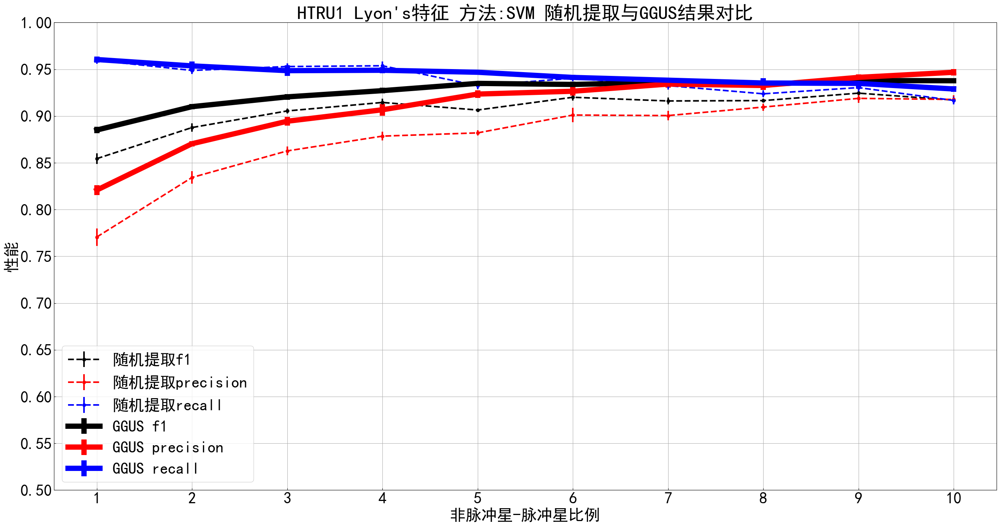

In [17]:
# 计算每组数据的平均值和标准差
def bar_means(data):
    means = np.mean(data,axis=1)
    return means
def bar_errors(data):
    errors= np.std(data, axis=1) / np.sqrt(len(data[0]))
    return errors
plt.figure(figsize=(32, 16))
plt.errorbar(range(1,len(SVMtrain_f1)+1), bar_means(SVMval_f1), bar_errors(SVMval_f1), fmt='o', linestyle='--',label='随机提取f1',color=(0, 0, 0), linewidth=3)
plt.errorbar(range(1,len(SVMtrain_f1)+1), bar_means(SVMval_precision), bar_errors(SVMval_precision), fmt='o', linestyle='--',label='随机提取precision',color='r', linewidth=3)
plt.errorbar(range(1,len(SVMtrain_f1)+1), bar_means(SVMval_recall), bar_errors(SVMval_recall), fmt='o', linestyle='--',label='随机提取recall',color='b', linewidth=3)

plt.errorbar(range(1,len(SVMtrain_f1)+1), bar_means(SVMDval_f1), bar_errors(SVMDval_f1), fmt='o', linestyle='-',label='GGUS f1',color=(0, 0, 0), linewidth=10)
plt.errorbar(range(1,len(SVMtrain_f1)+1), bar_means(SVMDval_precision), bar_errors(SVMDval_precision), fmt='o', linestyle='-',label='GGUS precision',color='r', linewidth=10)
plt.errorbar(range(1,len(SVMtrain_f1)+1), bar_means(SVMDval_recall), bar_errors(SVMDval_recall), fmt='o', linestyle='-',label='GGUS recall',color='b', linewidth=10)

plt.xlabel('非脉冲星-脉冲星比例')
plt.ylabel('性能')
title = 'HTRU1 Lyon\'s特征 方法:SVM 随机提取与GGUS结果对比'
plt.title(title)
yz = np.arange(0.5,1.05,0.05)
xz = np.arange(1,11,1)
plt.yticks(yz)
plt.xticks(xz)
plt.grid(True)
plt.legend()
dest_dir = "./plots/"
if not os.path.exists(dest_dir):
    os.makedirs(dest_dir)
plt.savefig(dest_dir + title + '.png', bbox_inches='tight')
plt.show()


In [18]:
print('f1',np.mean(bar_means(SVMDval_f1))-np.mean(bar_means(SVMval_f1)))
print('pre',np.mean(bar_means(SVMDval_precision))-np.mean(bar_means(SVMval_precision)))
print('rec',np.mean(bar_means(SVMDval_recall))-np.mean(bar_means(SVMval_recall)))

f1 0.019446429804404586
pre 0.032145331236142716
rec 0.00457712765957452


In [26]:

import pandas as pd


# 将数据整理成列表
data = [
    [f"{bar_means(SVMval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_means(SVMval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_means(SVMval_recall)[i]:.8f}" for i in range(10)],
    [f"{bar_means(SVMDval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_means(SVMDval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_means(SVMDval_recall)[i]:.8f}" for i in range(10)],
    [],
    [f"{bar_errors(SVMval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(SVMval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(SVMval_recall)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(SVMDval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(SVMDval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(SVMDval_recall)[i]:.8f}" for i in range(10)],
]

# 创建DataFrame
df = pd.DataFrame(data)

# 保存为Excel文件
df.to_excel('HTRU1 Lyon\‘s特征 方法:SVM 随机提取与GGUS结果对比2.xlsx', index=False)

In [19]:
from keras import backend as K

def precision_metric(y_true, y_pred):
    # 计算精确率
    precision = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_pred, 0, 1))) + K.epsilon())
    return precision

def recall_metric(y_true, y_pred):
    # 计算召回率
    recall = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) / (K.sum(K.round(K.clip(y_true, 0, 1))) + K.epsilon())
    return recall

def f1_metric(y_true, y_pred):
    # 计算精确率和召回率
    precision = precision_metric(y_true, y_pred)
    recall = recall_metric(y_true, y_pred)
    # 计算 F1 分数
    f1 = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return f1

CNN

In [20]:
# 定义一个函数，用于训练CNN模型并评估性能
def train_and_evaluate_CNN(grid_class,features,labels,grid_class_Cl,data_cleaned,labels_cleaned,times=10):
    AAtrain_f1 = []
    AAval_f1 = []
    AAtrain_precision = []
    AAval_precision = []
    AAtrain_recall = []
    AAval_recall = []

    AADtrain_f1 = []
    AADval_f1 = []
    AADtrain_precision = []
    AADval_precision = []
    AADtrain_recall = []
    AADval_recall = []

    for i in range(10):
        print('imblance: n=', i+1)
        Atrain_f1 = []
        Aval_f1 = []
        Atrain_precision = []
        Aval_precision = []
        Atrain_recall = []
        Aval_recall = []

        ADtrain_f1 = []
        ADval_f1 = []
        ADtrain_precision = []
        ADval_precision = []
        ADtrain_recall = []
        ADval_recall = []

        for j in range(times):
            print('This is ', j, 'th train' )
            
            X_train,Y_train,X_test,Y_test=get_data(grid_class, features, labels, n=i+1)
            DX_train, DY_train, DX_test, DY_test = get_data(grid_class_Cl,data_cleaned,labels_cleaned,n=i+1)

            # 创建并编译CNN模型
            model1 = models.Sequential()
            model1.add(layers.Conv1D(32, kernel_size=3, activation='relu', input_shape=(8,1)))
            model1.add(layers.MaxPooling1D(pool_size=1))
            model1.add(layers.Dropout(0.25))
            model1.add(layers.Conv1D(64, kernel_size=3, activation='relu'))
            model1.add(layers.MaxPooling1D(pool_size=1))
            model1.add(layers.Dropout(0.25))
            model1.add(layers.Flatten())
            model1.add(layers.Dense(128, activation='relu'))
            model1.add(layers.Dense(1, activation='sigmoid'))
            
            model1.compile(optimizer=optimizers.legacy.RMSprop(learning_rate=0.001),
                          loss=losses.binary_crossentropy,
                          metrics=[metrics.binary_accuracy])
            # 训练模型
            model1.fit(X_train, Y_train, epochs=10, batch_size=32, verbose=0)
            
            
            model2 = models.Sequential()
            model2.add(layers.Conv1D(32, kernel_size=3, activation='relu', input_shape=(8,1)))
            model2.add(layers.MaxPooling1D(pool_size=1))
            model2.add(layers.Dropout(0.25))
            model2.add(layers.Conv1D(64, kernel_size=3, activation='relu'))
            model2.add(layers.MaxPooling1D(pool_size=1))
            model2.add(layers.Dropout(0.25))
            model2.add(layers.Flatten())
            model2.add(layers.Dense(128, activation='relu'))
            model2.add(layers.Dense(1, activation='sigmoid'))
            
            model2.compile(optimizer=optimizers.legacy.RMSprop(learning_rate=0.001),
                          loss=losses.binary_crossentropy,
                          metrics=[metrics.binary_accuracy])
         
            # 训练模型
            model2.fit(X_train, Y_train, epochs=10, batch_size=32, verbose=0)
            
            #测试结果
            train_pred = np.where(model1.predict(X_train) >= 0.5, 1, 0)
            val_pred = np.where(model1.predict(X_test) >= 0.5, 1, 0)
            Dtrain_pred = np.where(model2.predict(DX_train) >= 0.5, 1, 0)
            Dval_pred = np.where(model1.predict(DX_test) >= 0.5, 1, 0)

            train_f1 = f1_score(Y_train,train_pred)
            val_f1 = f1_score(Y_test,val_pred)
            train_precision = precision_score(Y_train, train_pred)
            val_precision = precision_score(Y_test, val_pred)
            train_recall = recall_score(Y_train, train_pred)
            val_recall = recall_score(Y_test, val_pred)

            Dtrain_f1 = f1_score(DY_train,Dtrain_pred)
            Dval_f1 = f1_score(DY_test,Dval_pred)
            Dtrain_precision = precision_score(DY_train, Dtrain_pred)
            Dval_precision = precision_score(DY_test, Dval_pred)
            Dtrain_recall = recall_score(DY_train, Dtrain_pred)
            Dval_recall = recall_score(DY_test, Dval_pred)
           
            # 记录结果
            Atrain_f1.append(train_f1)
            Aval_f1.append(val_f1)
            Atrain_precision.append(train_precision)
            Aval_precision.append(val_precision)
            Atrain_recall.append(train_recall)
            Aval_recall.append(val_recall)

            ADtrain_f1.append(Dtrain_f1)
            ADval_f1.append(Dval_f1)
            ADtrain_precision.append(Dtrain_precision)
            ADval_precision.append(Dval_precision)
            ADtrain_recall.append(Dtrain_recall)
            ADval_recall.append(Dval_recall)

        AAtrain_f1.append(Atrain_f1)
        AAval_f1.append(Aval_f1)
        AAtrain_precision.append(Atrain_precision)
        AAval_precision.append(Aval_precision)
        AAtrain_recall.append(Atrain_recall)
        AAval_recall.append(Aval_recall)

        AADtrain_f1.append(ADtrain_f1)
        AADval_f1.append(ADval_f1)
        AADtrain_precision.append(ADtrain_precision)
        AADval_precision.append(ADval_precision)
        AADtrain_recall.append(ADtrain_recall)
        AADval_recall.append(ADval_recall) 

    return (
        AAtrain_f1, AAval_f1, AAtrain_precision, AAval_precision, AAtrain_recall, AAval_recall,
        AADtrain_f1, AADval_f1, AADtrain_precision, AADval_precision, AADtrain_recall, AADval_recall
    )



In [21]:
(CNNtrain_f1, CNNval_f1, CNNtrain_precision, CNNval_precision, CNNtrain_recall, CNNval_recall,
CNNDtrain_f1, CNNDval_f1, CNNDtrain_precision, CNNDval_precision, CNNDtrain_recall, CNNDval_recall
    )=train_and_evaluate_CNN(grid_class,features,labels,grid_class_Cl,data_cleaned,labels_cleaned, times=10)

imblance: n= 1
This is  0 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  1 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 1s 5ms/step
This is  2 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 956 val 0
训练集共有： 1917
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 2s 10ms/step
This is  3 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 955 val 0
训练集共有： 1911
测试集中脉冲星： 2

157/157 [==============================] - 0s 2ms/step
This is  8 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 1914 val 0
训练集共有： 2870
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 1914 val 0
训练集共有： 2875
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  9 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 1914 val 0
训练集共有： 2870
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 1914 val 0
训练集共有： 2875
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
imblance: n= 3
This is  0 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 2869 val 0
训练集共有： 3825
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 2870 val 0
训练集共有： 3831
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  1 th train
网格提取
训练

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  6 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 3829 val 0
训练集共有： 4785
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  7 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 3829 val 0
训练集共有： 4785
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  8 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 3829 val 0
训练集共有： 4785
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 3825 val 0
训练集共有： 4786
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 

157/157 [==============================] - 0s 2ms/step
This is  3 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 5741 val 0
训练集共有： 6697
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 5742 val 0
训练集共有： 6703
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  4 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 5741 val 0
训练集共有： 6697
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 5742 val 0
训练集共有： 6703
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 3ms/step
This is  5 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 5741 val 0
训练集共有： 6697
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 5742 val 0
训练集共有： 6703
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  6 th train
网格提取
训练集中脉冲星： 956 val 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 7656 val 0
训练集共有： 8617
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  1 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 7655 val 0
训练集共有： 8611
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 7656 val 0
训练集共有： 8617
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 3ms/step
This is  2 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 7655 val 0
训练集共有： 8611
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 7656 val 0
训练集共有： 8617
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  3 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 7655 val 0
训练集共有： 8611
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 7656 val 0
训练集共有： 8617
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 

157/157 [==============================] - 1s 3ms/step
This is  8 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 8611 val 0
训练集共有： 9567
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 8611 val 0
训练集共有： 9572
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 2ms/step
This is  9 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 8611 val 0
训练集共有： 9567
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 8611 val 0
训练集共有： 9572
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 3ms/step
imblance: n= 10
This is  0 th train
网格提取
训练集中脉冲星： 956 val 956
训练集中RFI： 9569 val 0
训练集共有： 10525
测试集中脉冲星： 240 val 240
测试集中RFI： 4782 val 0
测试集共有： 5022 

网格提取
训练集中脉冲星： 961 val 961
训练集中RFI： 9570 val 0
训练集共有： 10531
测试集中脉冲星： 235 val 235
测试集中RFI： 4782 val 0
测试集共有： 5017 

157/157 [==============================] - 0s 3ms/step
This is  1 th train
网格提取

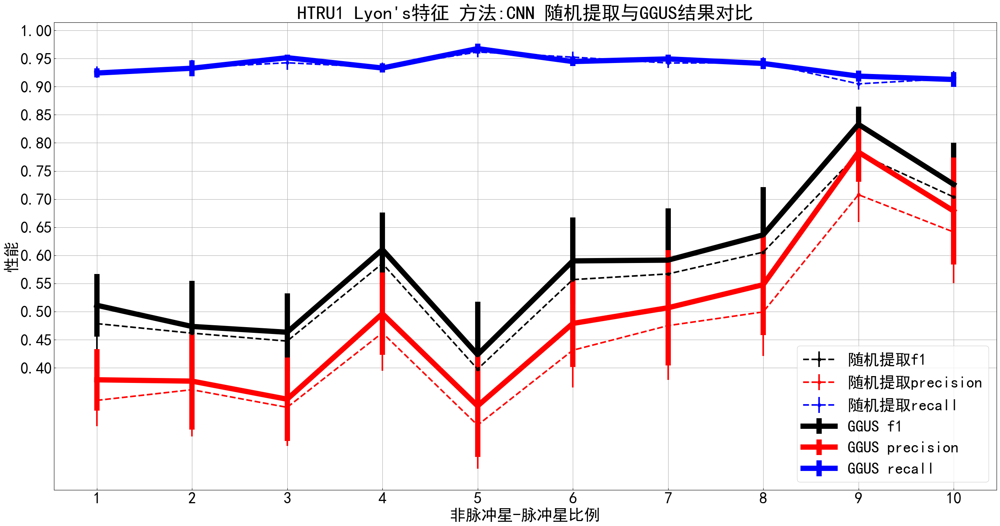

In [22]:
# 计算每组数据的平均值和标准差
def bar_means(data):
    means = np.mean(data,axis=1)
    return means
def bar_errors(data):
    errors= np.std(data, axis=1) / np.sqrt(len(data[0]))
    return errors
plt.figure(figsize=(32, 16))
plt.errorbar(range(1,len(CNNtrain_f1)+1), bar_means(CNNval_f1), bar_errors(CNNval_f1), fmt='o', linestyle='--',label='随机提取f1',color=(0, 0, 0), linewidth=3)
plt.errorbar(range(1,len(CNNtrain_f1)+1), bar_means(CNNval_precision), bar_errors(CNNval_precision), fmt='o', linestyle='--',label='随机提取precision',color='r', linewidth=3)
plt.errorbar(range(1,len(CNNtrain_f1)+1), bar_means(CNNval_recall), bar_errors(CNNval_recall), fmt='o', linestyle='--',label='随机提取recall',color='b', linewidth=3)

plt.errorbar(range(1,len(CNNtrain_f1)+1), bar_means(CNNDval_f1), bar_errors(CNNDval_f1), fmt='o', linestyle='-',label='GGUS f1',color=(0, 0, 0), linewidth=10)
plt.errorbar(range(1,len(CNNtrain_f1)+1), bar_means(CNNDval_precision), bar_errors(CNNDval_precision), fmt='o', linestyle='-',label='GGUS precision',color='r', linewidth=10)
plt.errorbar(range(1,len(CNNtrain_f1)+1), bar_means(CNNDval_recall), bar_errors(CNNDval_recall), fmt='o', linestyle='-',label='GGUS recall',color='b', linewidth=10)

plt.xlabel('非脉冲星-脉冲星比例')
plt.ylabel('性能')
title = 'HTRU1 Lyon\'s特征 方法:CNN 随机提取与GGUS结果对比'
plt.title(title)
yz = np.arange(0.4,1.05,0.05)
xz = np.arange(1,11,1)
plt.yticks(yz)
plt.xticks(xz)
plt.grid(True)
plt.legend()
dest_dir = "./plots/"
if not os.path.exists(dest_dir):
    os.makedirs(dest_dir)
plt.savefig(dest_dir + title + '.png', bbox_inches='tight')
plt.show()


In [23]:
print('f1',np.mean(bar_means(CNNDval_f1))-np.mean(bar_means(CNNval_f1)))
print('pre',np.mean(bar_means(CNNDval_precision))-np.mean(bar_means(CNNval_precision)))
print('rec',np.mean(bar_means(CNNDval_recall))-np.mean(bar_means(CNNval_recall)))

f1 0.02733658897904434
pre 0.037578383350412525
rec 0.0021586879432624606


In [27]:

import pandas as pd

# 将数据整理成列表
data = [
    [f"{bar_means(CNNval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_means(CNNval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_means(CNNval_recall)[i]:.8f}" for i in range(10)],
    [f"{bar_means(CNNDval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_means(CNNDval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_means(CNNDval_recall)[i]:.8f}" for i in range(10)],
    [],
    [f"{bar_errors(CNNval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(CNNval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(CNNval_recall)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(CNNDval_f1)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(CNNDval_precision)[i]:.8f}" for i in range(10)],
    [f"{bar_errors(CNNDval_recall)[i]:.8f}" for i in range(10)],
]

# 创建DataFrame
df = pd.DataFrame(data)

# 保存为Excel文件
df.to_excel('HTRU1 Lyon\‘s特征 方法:CNN 随机提取与GGUS结果对比2.xlsx', index=False)